In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib qt
# %matplotlib inline
import seaborn as sns
sns.set_style("white")
import os
import mne
from mne.io import concatenate_raws, read_raw_edf
import scipy.io
import pandas as pd
from pandas import read_excel

## Load data

In [2]:
raw = mne.io.read_raw_edf('EMOTIV_S1.edf',preload=True)

Extracting EDF parameters from /Users/bish/Documents/Project arjun/EEG/Data visualisation/EMOTIV_S1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 75263  =      0.000 ...   587.992 secs...


## load markers

In [3]:
event_markers = pd.read_excel('EMOTIV_S1_markers.xlsx')
event_ids = [1,2,3,4,5]
event_keys = {"EyesOpenedStart":1, "EyesOpenedEnd":2, "EyesClosedStart":3, "EyesClosedEnd":4, 
              "PenaltyKickTrial":5}
onset = event_markers["time"]
index = event_markers["marker"]

# Pre-processing

### Pick channels

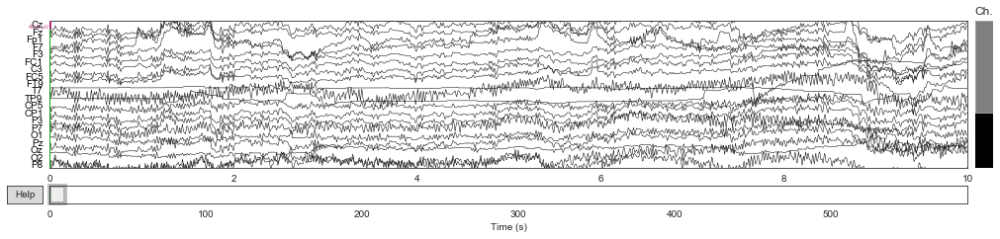

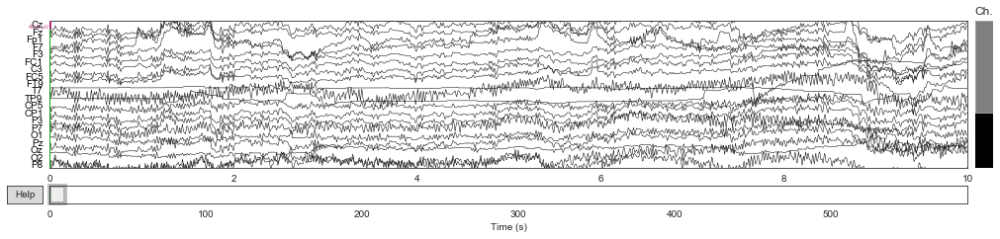

In [4]:
eeg_ch_names = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'TP9', 'CP5', 'CP1', 'P3', 'P7', 'O1', 'Pz', 'Oz', 'O2', 'P8', 'P4', 'CP2', 'CP6', 'TP10', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
picks = mne.pick_channels(raw.info["ch_names"], eeg_ch_names)
pick_raw = raw.copy().pick_channels(eeg_ch_names)
pick_raw.plot()

## Pick single channel

In [54]:
pick_ch1 = ['F7']
pick_ch2 = ['Fp1']
pick_ch3 = ['Fp2']
pick_ch4 = ['F8']

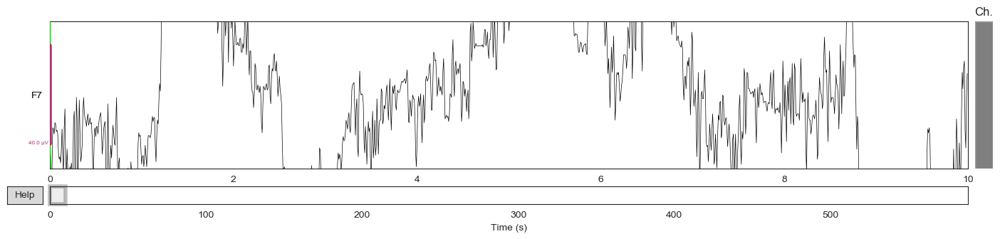

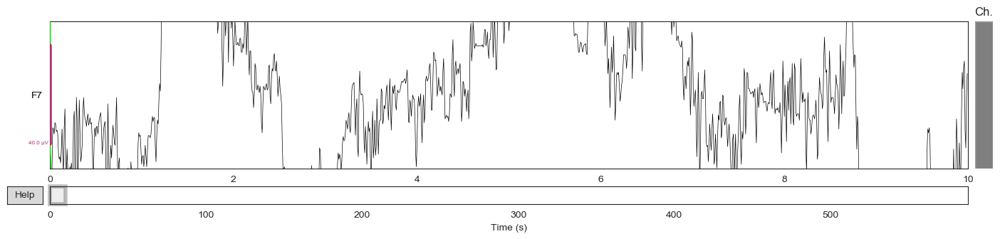

In [55]:
pick_raw_ch1 = pick_raw.copy().pick_channels(pick_ch1)
pick_raw_ch1.plot()

### Fit data to montage

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


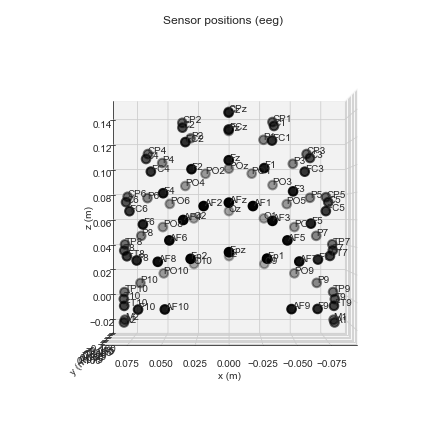

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


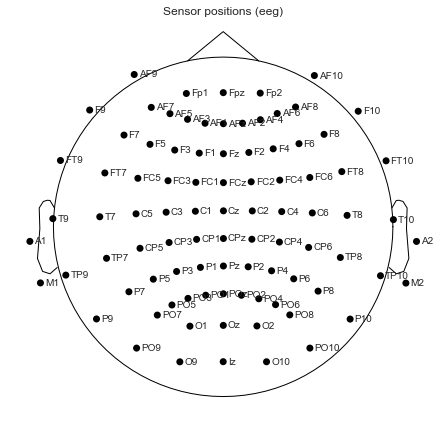

<RawEDF | EMOTIV_S1.edf, 32 x 75264 (588.0 s), ~18.5 MB, data loaded>

In [5]:
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
fig = ten_twenty_montage.plot(kind='3d')
fig.gca().view_init(azim=70, elev=15)
ten_twenty_montage.plot(kind='topomap', show_names=True)
pick_raw.set_montage(ten_twenty_montage)

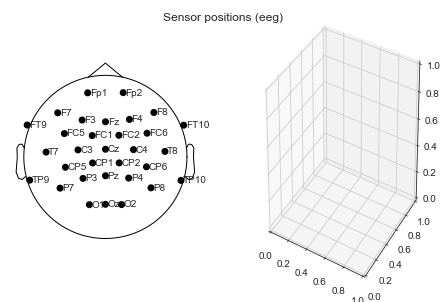

In [6]:
raw_1020 = pick_raw.copy().set_montage(ten_twenty_montage)
fig = plt.figure()
ax2d = fig.add_subplot(121)
ax3d = fig.add_subplot(122, projection='3d')
raw_1020.plot_sensors(ch_type='eeg', axes=ax2d, show_names=True)
raw_1020.plot_sensors(ch_type='eeg', axes=ax3d, kind='3d', show_names=True)
ax3d.view_init(azim=70, elev=15)

### PSD all channels

Effective window size : 16.000 (s)


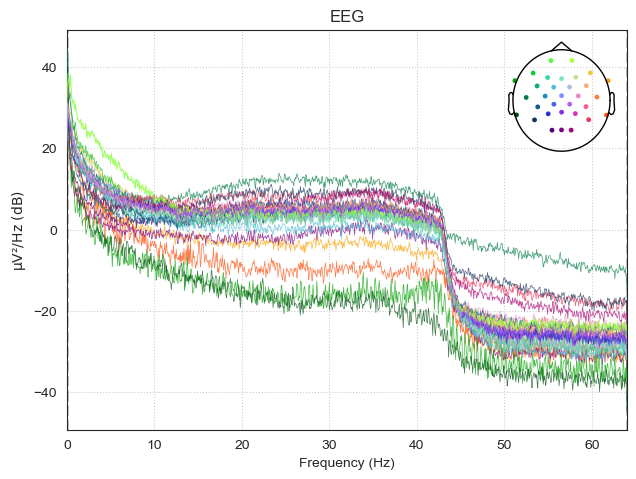

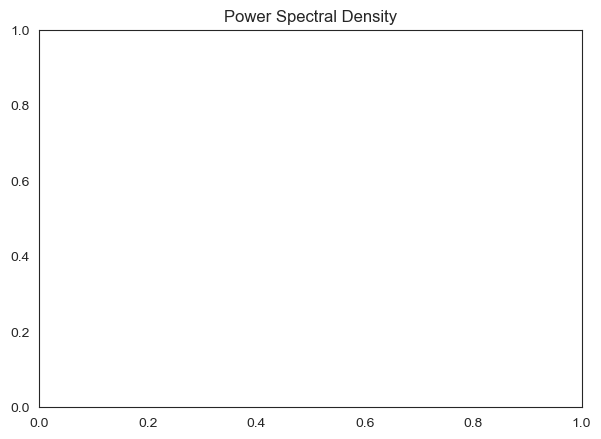

In [7]:
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
pick_raw.plot_psd(spatial_colors = True)
plt.gca().set(title='Power Spectral Density');
plt.savefig("PSD_raw")

## Pick 4 channels

Effective window size : 16.000 (s)


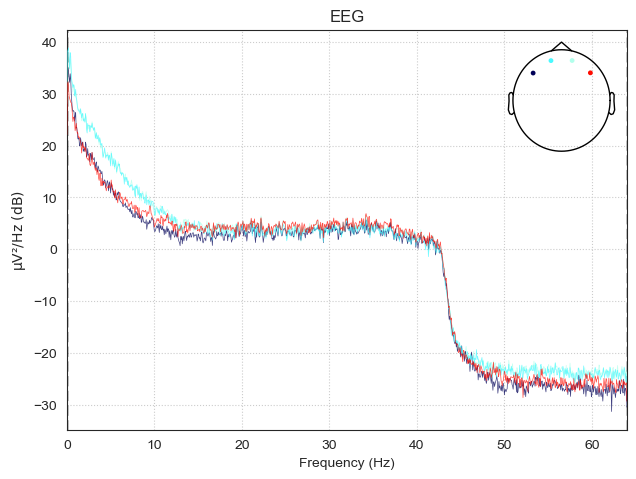

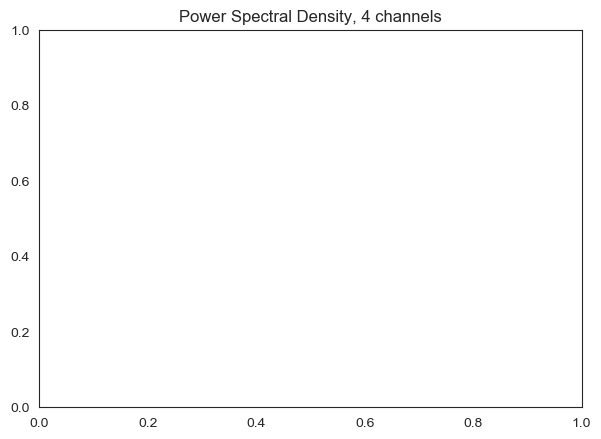

In [8]:
plot_4ch = ['F7', 'Fp1', 'Fp2', 'F8']
pick_raw.plot_psd(picks=plot_4ch ,spatial_colors = True)
plt.gca().set(title='Power Spectral Density, 4 channels');
plt.savefig("PSD_raw_4ch")

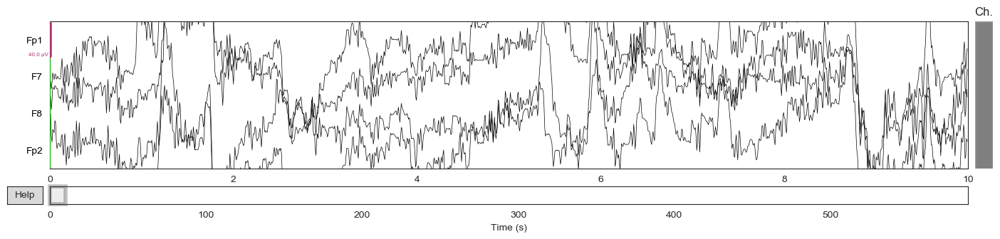

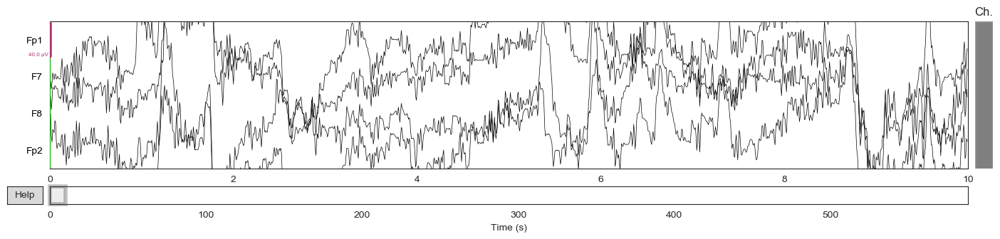

In [9]:
pick_raw_4 = pick_raw.copy().pick_channels(plot_4ch)
pick_raw_4.plot()

### Pick single channel

### Time domain

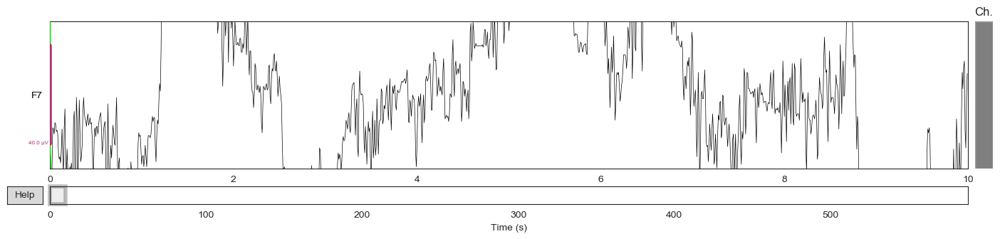

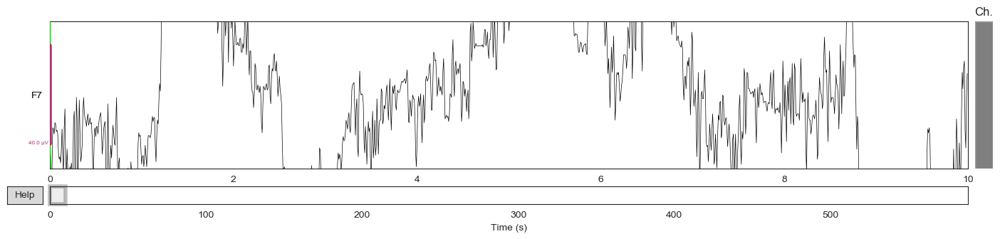

In [50]:
pick_raw_ch1 = pick_raw.copy().pick_channels(pick_ch1)
pick_raw_ch1.plot()

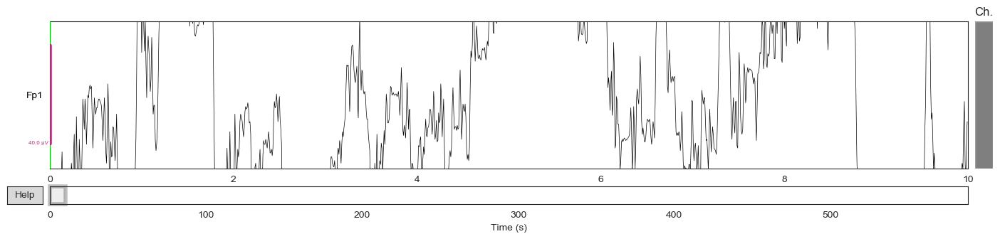

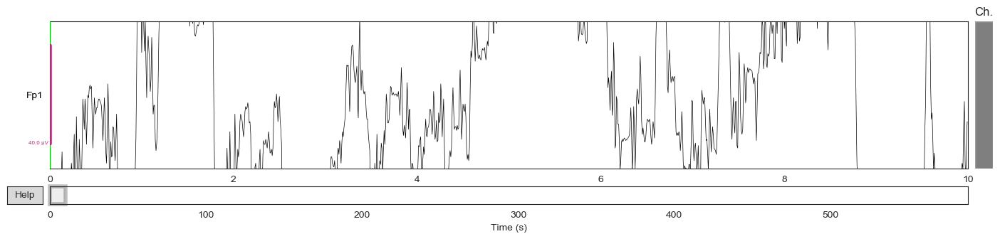

In [51]:
pick_raw_ch2 = pick_raw.copy().pick_channels(pick_ch2)
pick_raw_ch2.plot()

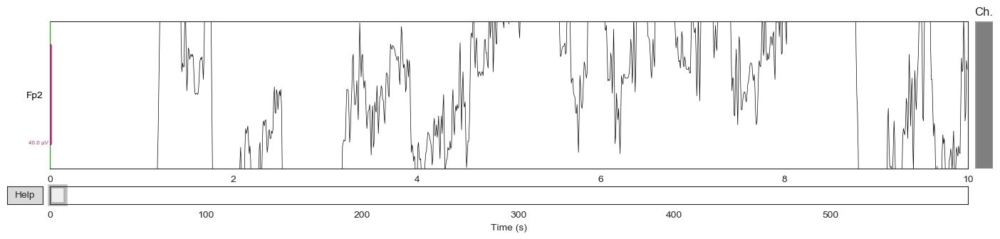

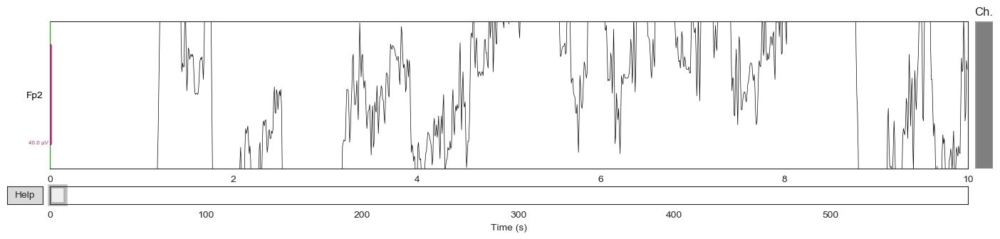

In [52]:
pick_raw_ch3 = pick_raw.copy().pick_channels(pick_ch3)
pick_raw_ch3.plot()

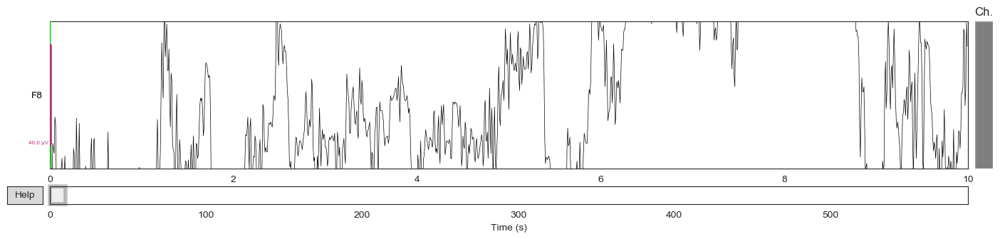

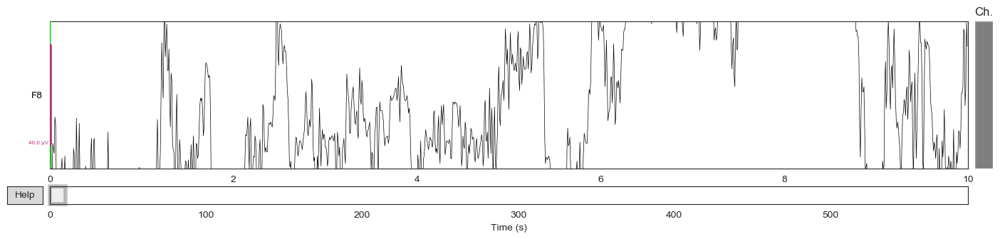

In [53]:
pick_raw_ch4 = pick_raw.copy().pick_channels(pick_ch4)
pick_raw_ch4.plot()

### Plot single channel PSD

Effective window size : 16.000 (s)
Need more than one channel to make topography for eeg. Disabling interactivity.


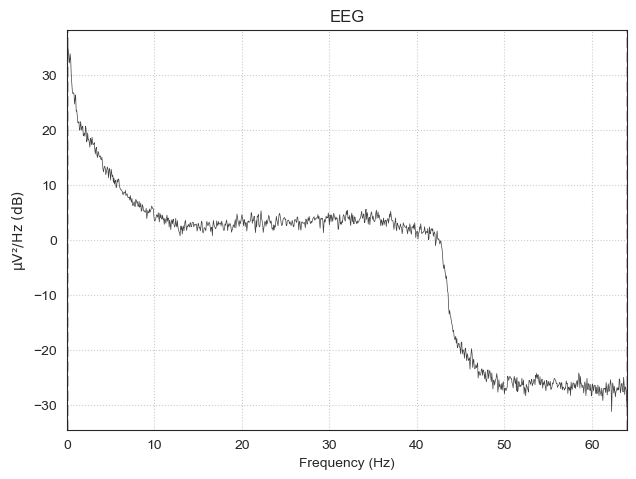

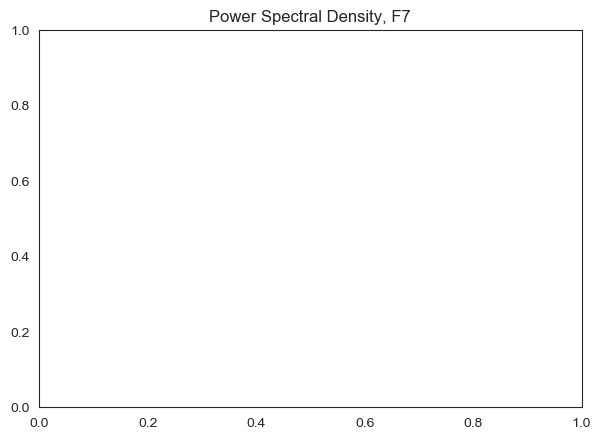

In [11]:
pick_raw.plot_psd(picks=pick_ch1, spatial_colors = True)
plt.gca().set(title='Power Spectral Density, F7');
plt.savefig("PSD_raw_F7")

Effective window size : 16.000 (s)
Need more than one channel to make topography for eeg. Disabling interactivity.


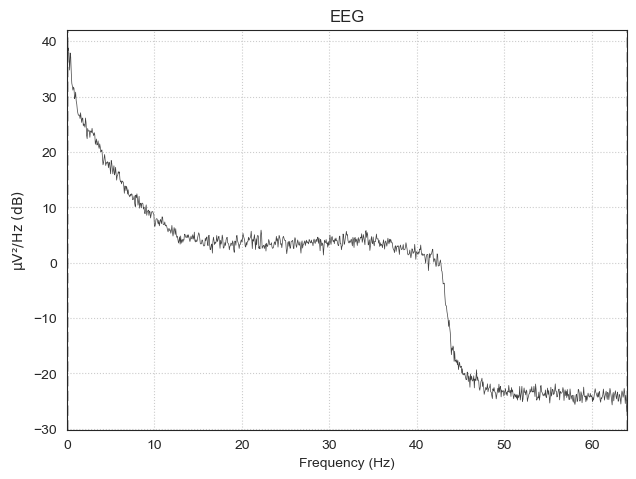

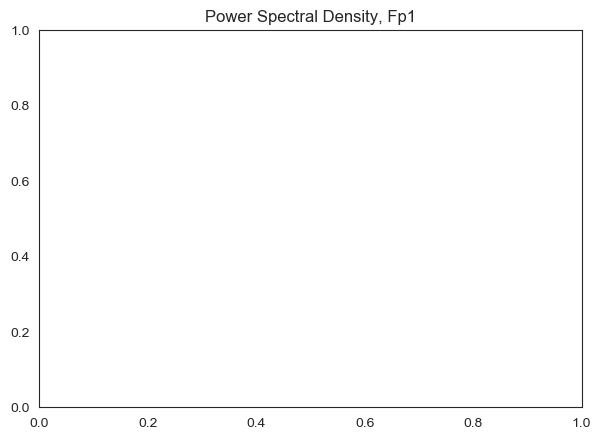

In [12]:
pick_raw.plot_psd(picks=pick_ch2, spatial_colors = True)
plt.gca().set(title='Power Spectral Density, Fp1');
plt.savefig("PSD_raw_Fp1")

Effective window size : 16.000 (s)
Need more than one channel to make topography for eeg. Disabling interactivity.


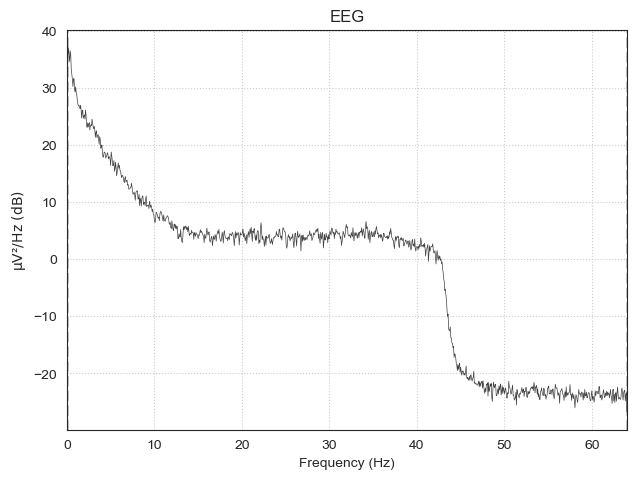

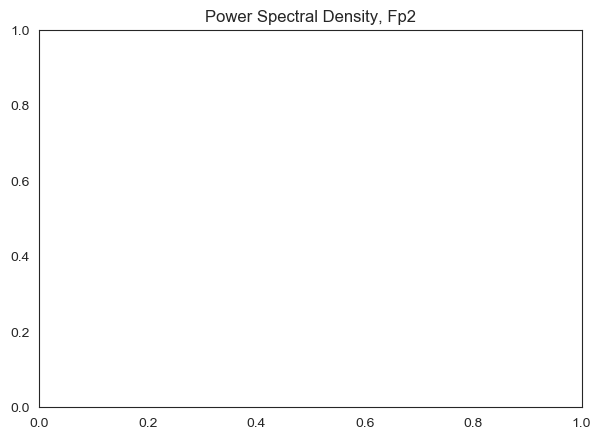

In [13]:
pick_raw.plot_psd(picks=pick_ch3, spatial_colors = True)
plt.gca().set(title='Power Spectral Density, Fp2');
plt.savefig("PSD_raw_Fp2")

Effective window size : 16.000 (s)
Need more than one channel to make topography for eeg. Disabling interactivity.


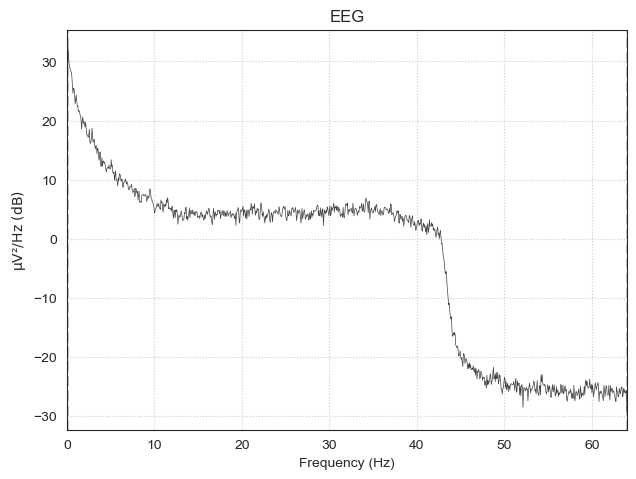

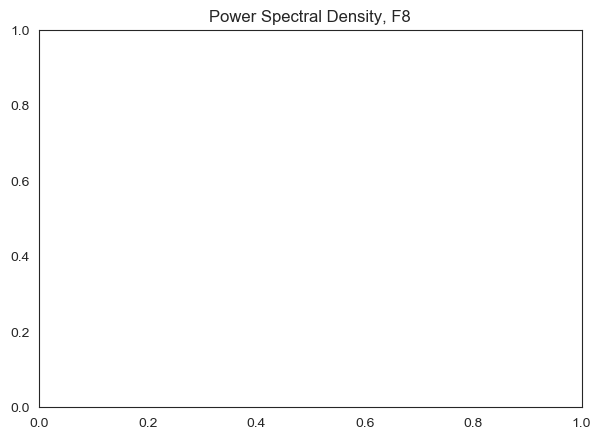

In [14]:
pick_raw.plot_psd(picks=pick_ch4, spatial_colors = True)
plt.gca().set(title='Power Spectral Density, F8');
plt.savefig("PSD_raw_F8")

### Re-referencing 

In [15]:
pick_avg_ref, array = mne.set_eeg_reference(pick_raw, ref_channels='average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom EEG reference.


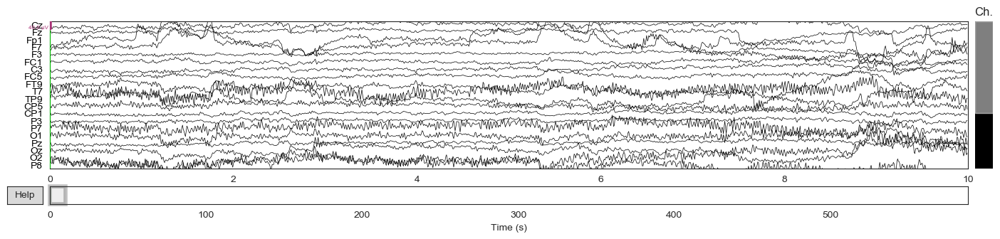

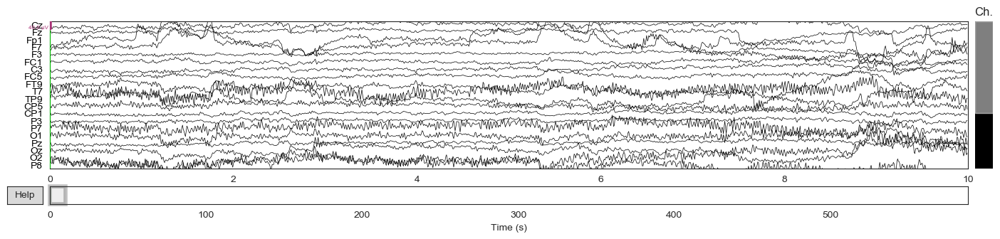

In [16]:
#used preload = True above so that data can be loaded to plot here
pick_avg_ref.plot()

## Filtering 

### Bandpass filtering 

In [17]:
l_freq = 0.1
h_freq = 45
filter_pick_avg_ref = pick_avg_ref.filter(l_freq, h_freq, picks=None, filter_length='auto', 
                                        l_trans_bandwidth='auto', h_trans_bandwidth='auto', 
                                        n_jobs=1, method='fir', iir_params=None, phase='zero', 
                                        fir_window='hamming', fir_design='firwin', 
                                        pad='reflect_limited', verbose=None)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 4225 samples (33.008 sec)



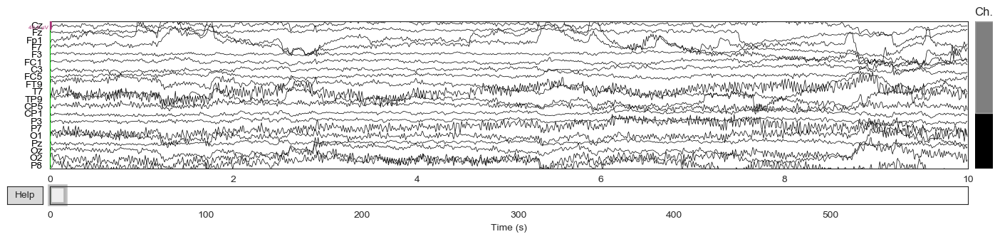

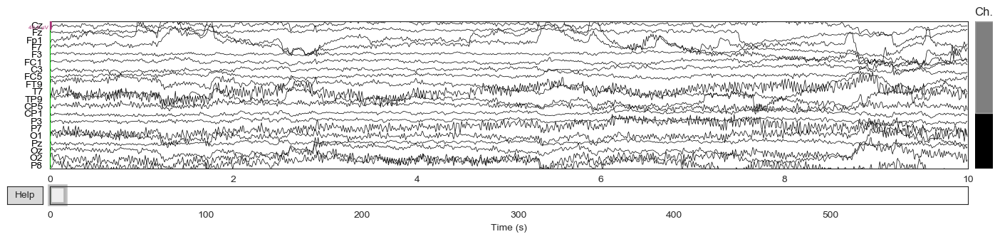

In [18]:
filter_pick_avg_ref.plot()

# Notch filter

In [19]:
freqs = 60
notch_filter_pick_avg_ref = filter_pick_avg_ref.notch_filter(freqs, picks=None, filter_length='auto', notch_widths=None, trans_bandwidth=1.0, n_jobs=1, method='fir', iir_params=None, mt_bandwidth=None, p_value=0.05, phase='zero', fir_window='hamming', fir_design='firwin', pad='reflect_limited', verbose=None)

Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 845 samples (6.602 sec)



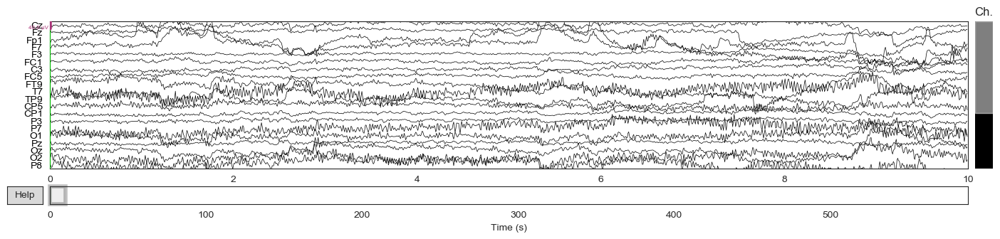

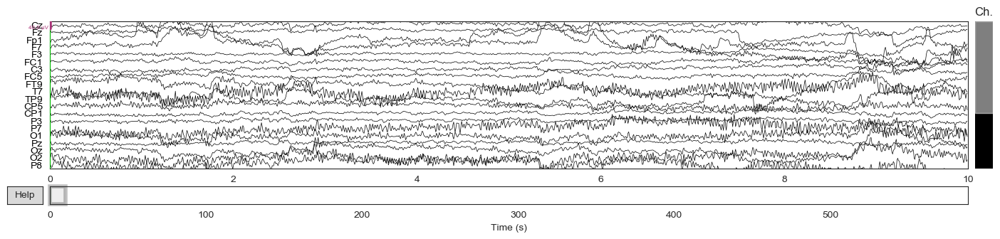

In [20]:
notch_filter_pick_avg_ref.plot()

## ICA

In [21]:
from mne.preprocessing import ICA
ica = ICA(n_components=32, random_state=97)
ica.fit(notch_filter_pick_avg_ref)

Fitting ICA to data using 32 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 32 components
Fitting ICA took 11.1s.


/Users/bish/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


<ICA  |  raw data decomposition, fit (fastica): 75264 samples, 32 components, channels used: "eeg">

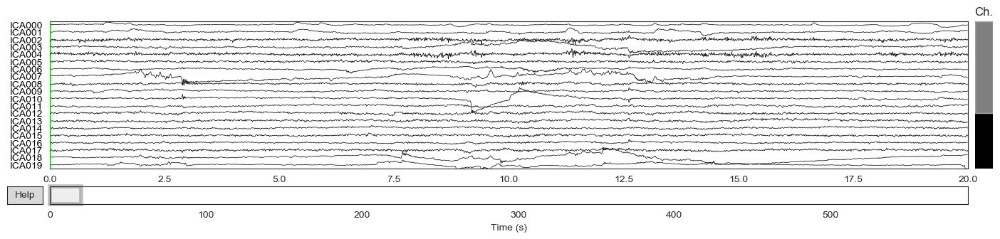

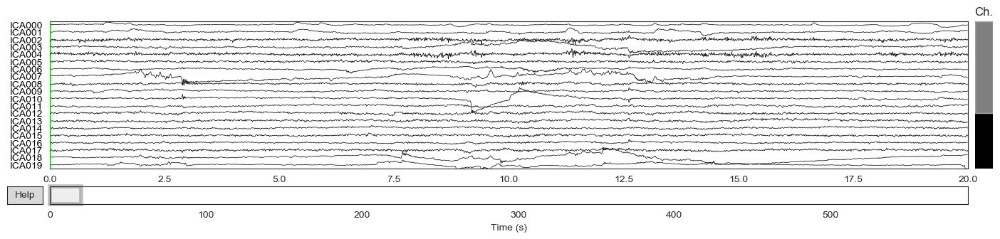

In [22]:
raw.load_data()
ica.plot_sources(notch_filter_pick_avg_ref)

    Using multitaper spectrum estimation with 7 DPSS windows
294 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
294 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
294 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
294 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
294 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


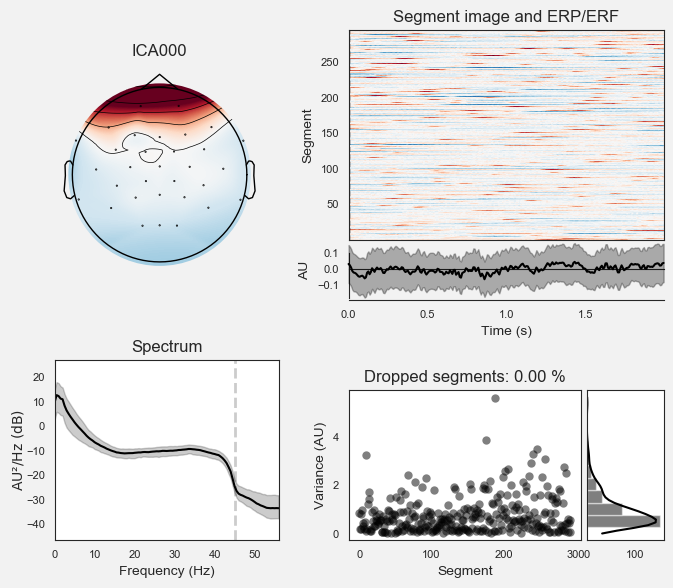

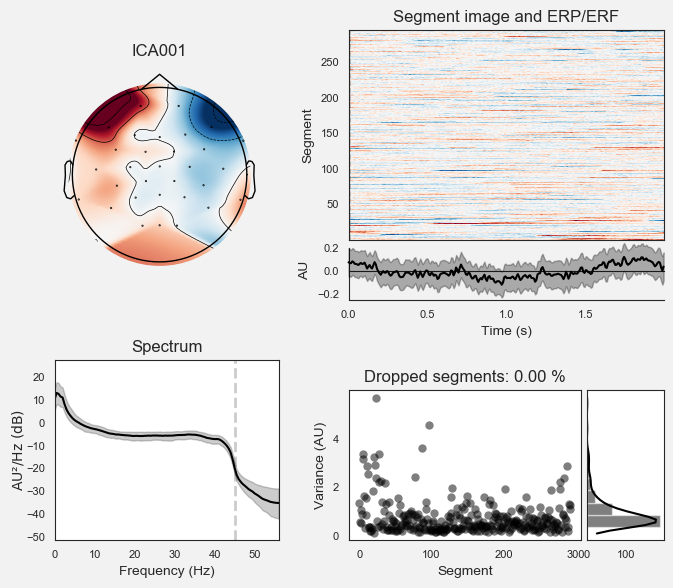

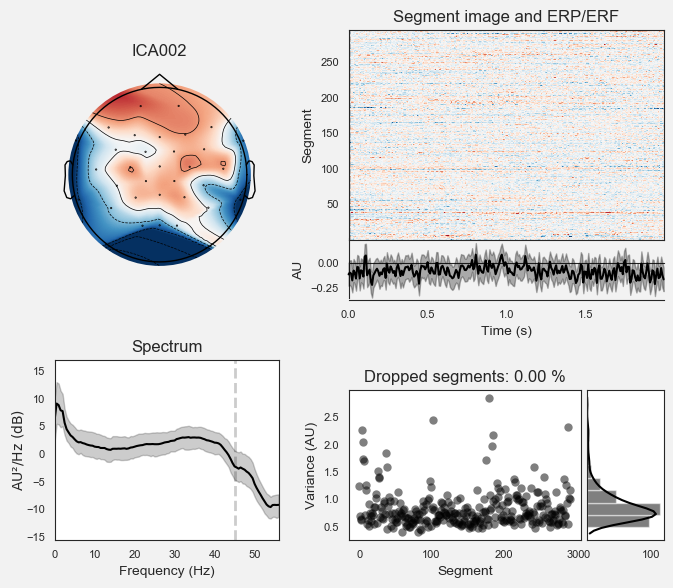

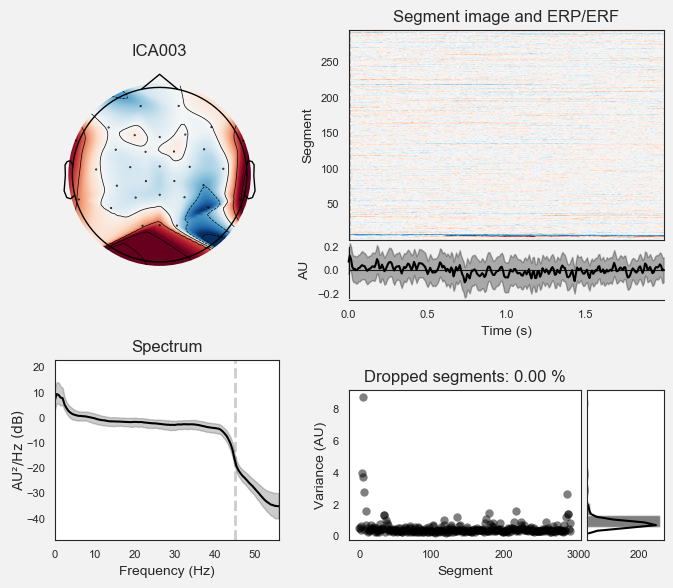

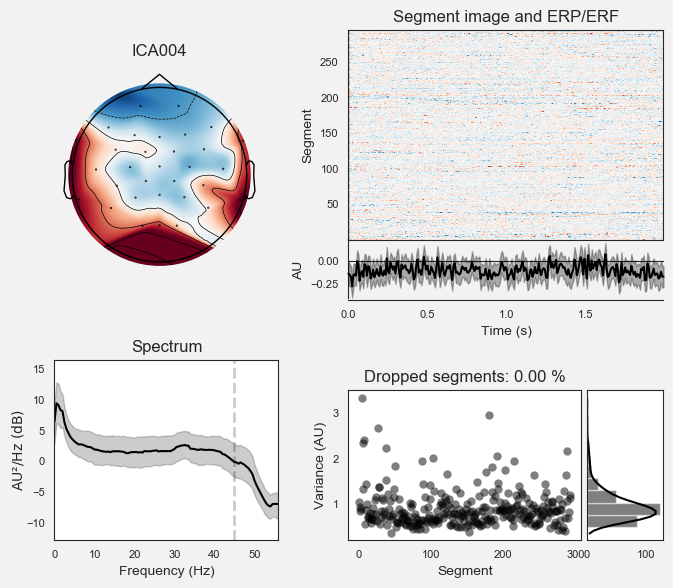

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [23]:
ica.plot_properties(notch_filter_pick_avg_ref)

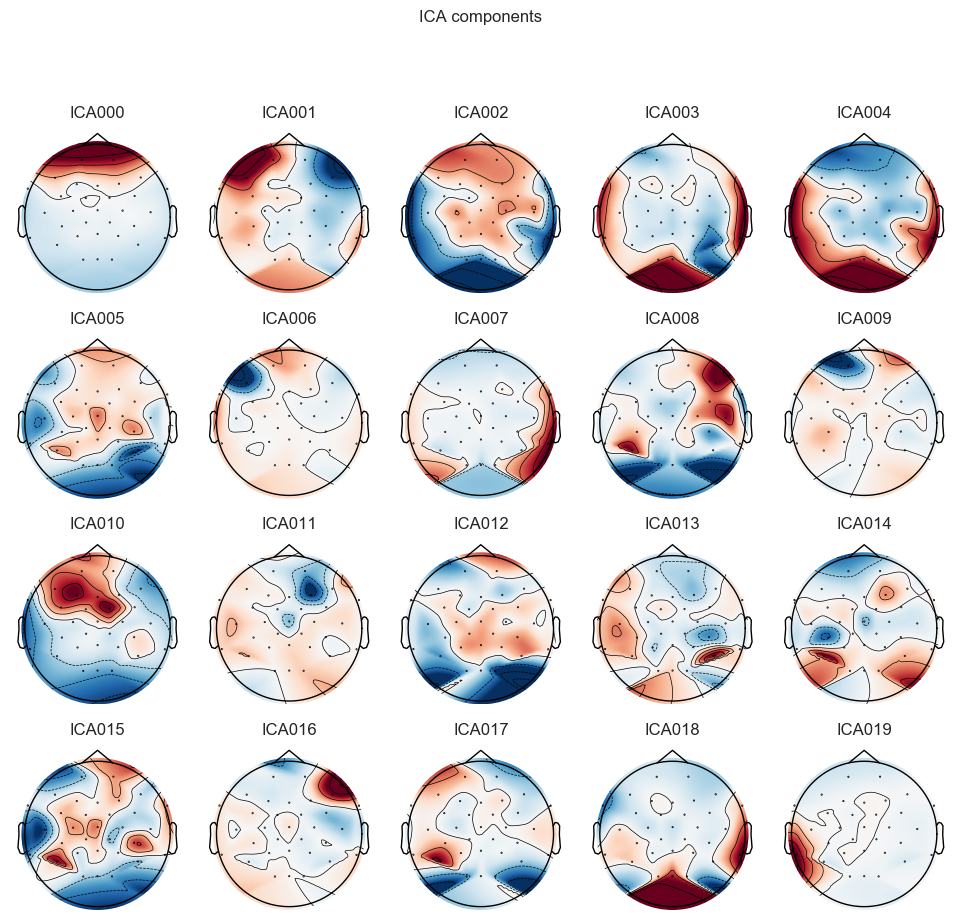

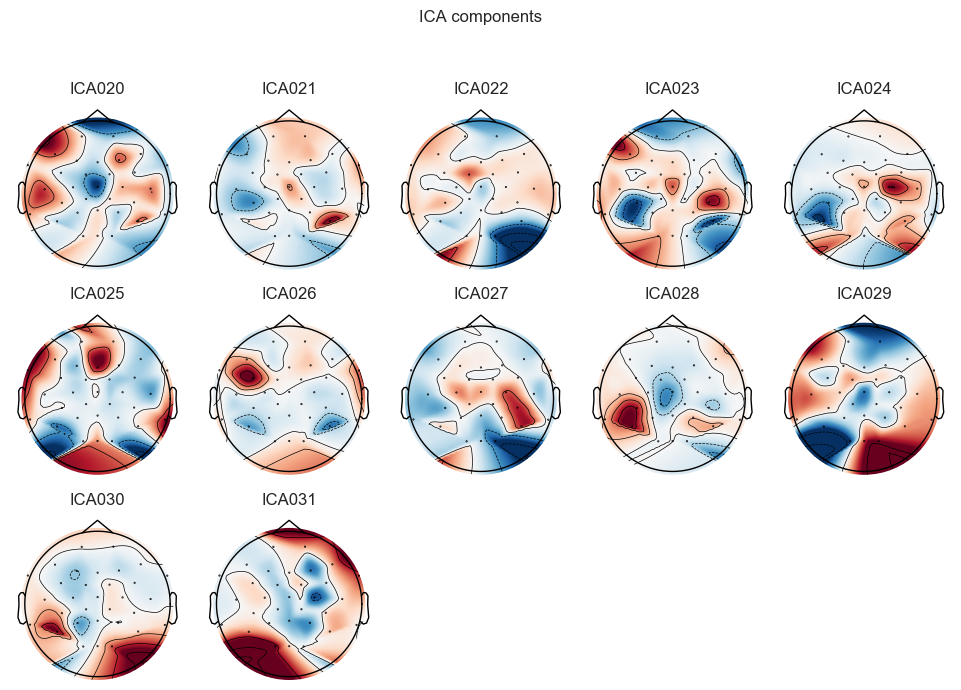

[<Figure size 975x942 with 20 Axes>, <Figure size 975x706.5 with 12 Axes>]

In [24]:
ica.plot_components()

In [25]:
ica.exclude = [0, 1, 2, 15, 19]

In [26]:
reconst_raw = notch_filter_pick_avg_ref.copy()
ica.apply(reconst_raw)

Transforming to ICA space (32 components)
Zeroing out 5 ICA components


<RawEDF | EMOTIV_S1.edf, 32 x 75264 (588.0 s), ~18.5 MB, data loaded>

### Comparison

Transforming to ICA space (32 components)
Zeroing out 5 ICA components


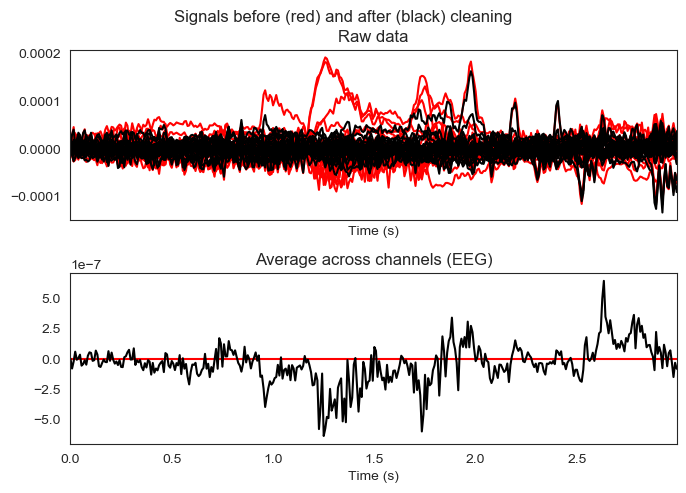

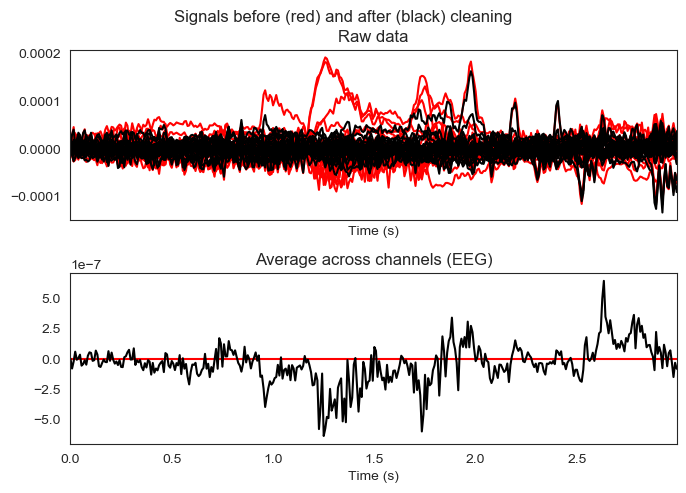

In [27]:
ica.plot_overlay(notch_filter_pick_avg_ref)

### Before ICA

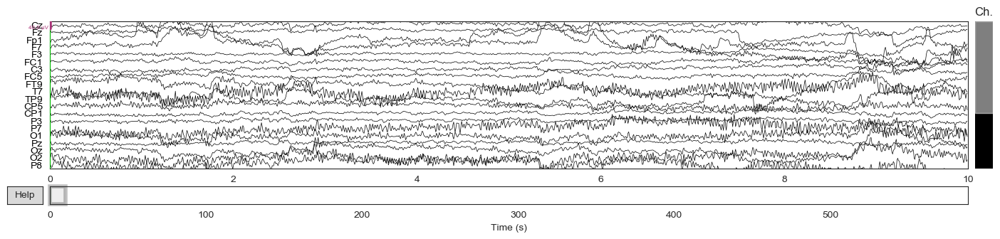

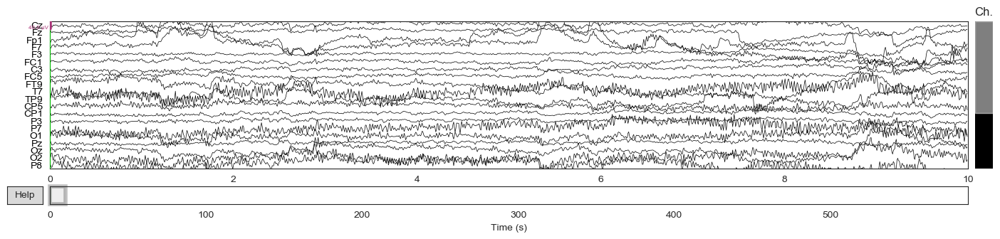

In [28]:
notch_filter_pick_avg_ref.plot()

### After ICA

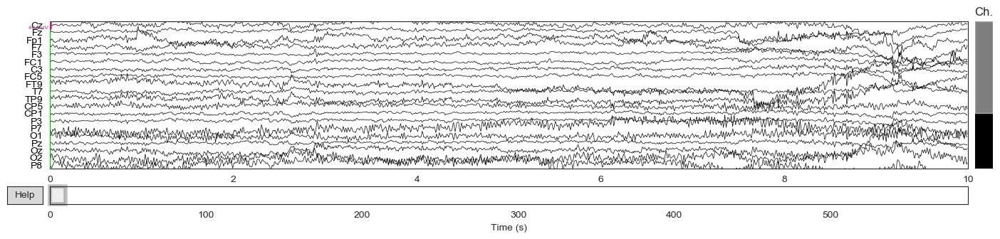

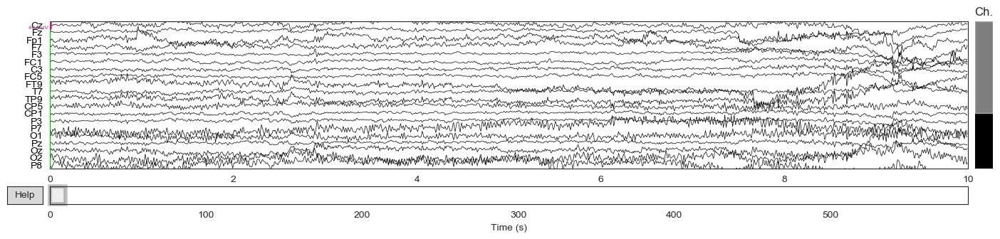

In [29]:
reconst_raw.plot()

In [30]:
### Filter 

In [31]:
l_freq = 0.1
h_freq = 45
filter_reconst = reconst_raw.filter(l_freq, h_freq, picks=None, filter_length='auto', 
                                        l_trans_bandwidth='auto', h_trans_bandwidth='auto', 
                                        n_jobs=1, method='fir', iir_params=None, phase='zero', 
                                        fir_window='hamming', fir_design='firwin', 
                                        pad='reflect_limited', verbose=None)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 4225 samples (33.008 sec)



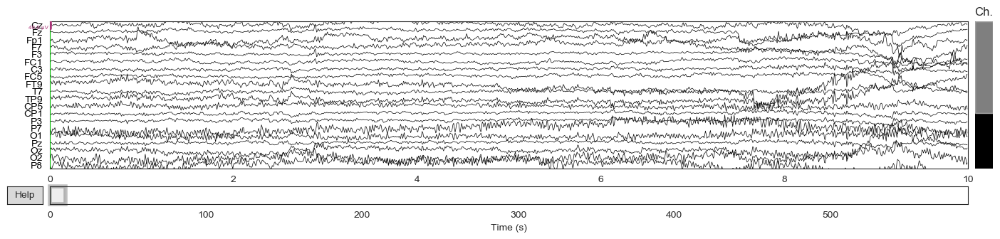

In [32]:
reconst = filter_reconst.plot()

Effective window size : 16.000 (s)


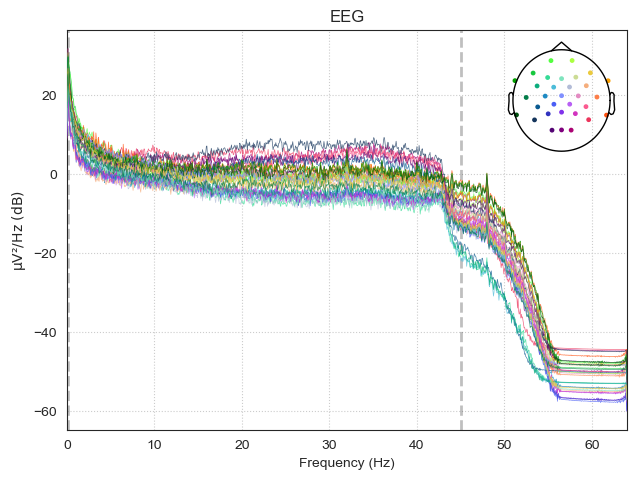

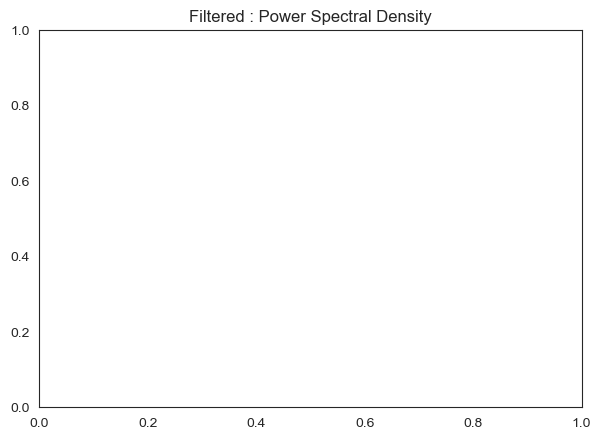

In [33]:
filter_reconst.plot_psd(spatial_colors = True)
plt.gca().set(title='Filtered : Power Spectral Density');
plt.savefig("Filter_PSD_raw")

### 4 channels after filtering 

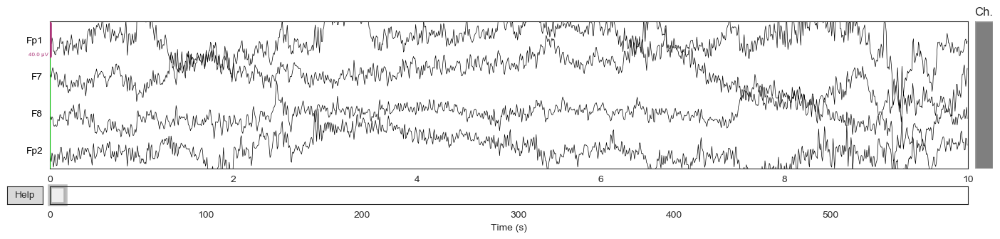

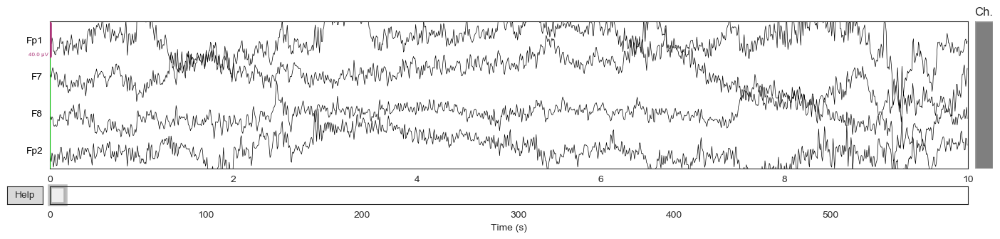

In [34]:
reconst_pick_raw_4 = filter_reconst.copy().pick_channels(plot_4ch)
reconst_pick_raw_4.plot()

Effective window size : 16.000 (s)


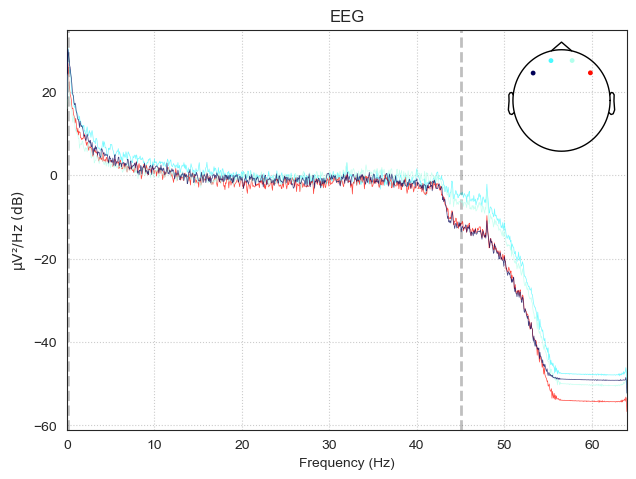

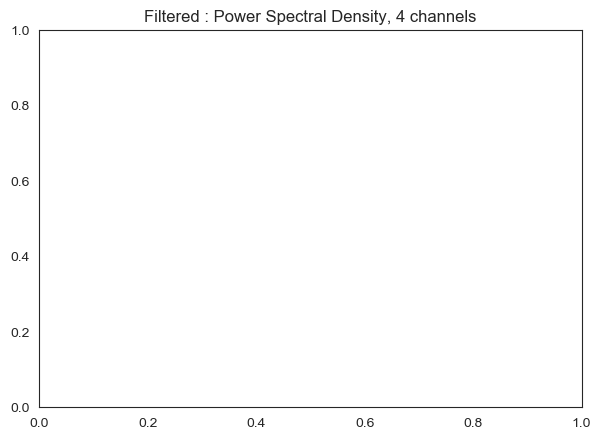

In [35]:
reconst_pick_raw_4.plot_psd(picks = plot_4ch ,spatial_colors = True)
plt.gca().set(title='Filtered : Power Spectral Density, 4 channels');
plt.savefig("Filter_PSD_raw_4ch")

# Open BCI

### Loading EEG data

In [36]:
file = open("OB_S1.txt","r")
file_1 = file.readlines()
file_new = open("New","a")
j = 0
for i in file_1:
    j = j+1
    
    if j >=7:
        file_new.write(i)

In [37]:
df = pd.read_csv('new',names=['sample_index','e1','e2','e3','e4','accel_x','accel_y','aux','timestamp'])
# print(df)
df.drop_duplicates(subset=['e1','e2','e3','e4','timestamp'], keep='last', inplace=True)
df = df.iloc[:,[1,2,3,4]]
data = df.to_numpy()
data = data.T
print(data)

[[1017.66 1018.7  1007.88 ...  995.86 1007.26 1003.65]
 [1163.44 1166.49 1167.26 ... 1161.77 1169.44 1154.15]
 [1337.39 1337.73 1331.66 ... 1331.68 1343.87 1331.22]
 [ 438.58  581.5   578.12 ...  435.29  410.57  294.68]]


In [38]:
n_channels = 4
sfreq = 200
ch_names = ['ch1','ch2','ch3','ch4']
info = mne.create_info(n_channels, sfreq, ch_types='eeg', verbose=None)
print(info)
new_data = mne.io.RawArray(data, info, first_samp=0, copy='auto', verbose=None)
print(new_data)

<Info | 7 non-empty values
 bads: []
 ch_names: 0, 1, 2, 3
 chs: 4 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 4
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=4, n_times=135345
    Range : 0 ... 135344 =      0.000 ...   676.720 secs
Ready.
<RawArray | 4 x 135345 (676.7 s), ~4.1 MB, data loaded>


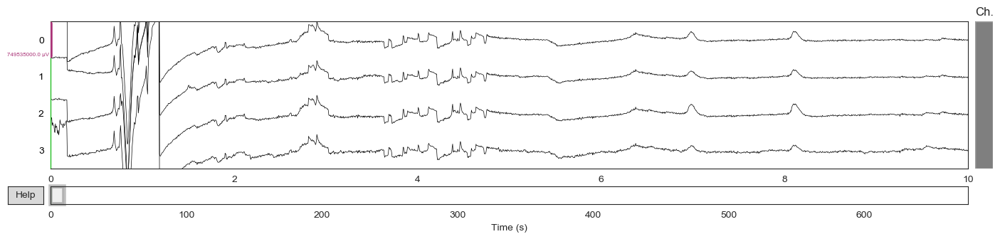

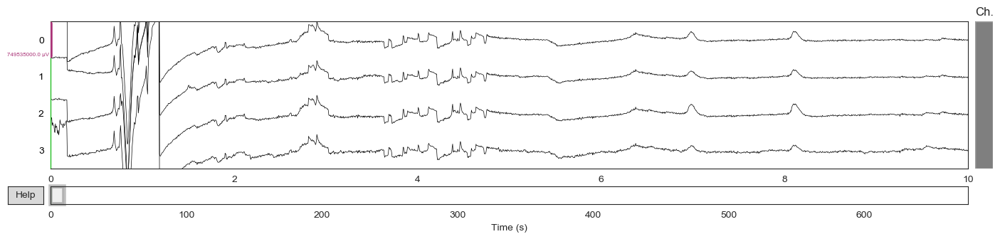

In [39]:
new_data.plot(scalings='auto')

# Filtering 

In [40]:
l_freq = 0.1
h_freq = 45
filter_data = new_data.filter(l_freq, h_freq, picks='eeg',filter_length='auto', 
                                        l_trans_bandwidth='auto', h_trans_bandwidth='auto', 
                                        n_jobs=1, method='fir', iir_params=None, phase='zero', 
                                        fir_window='hamming', fir_design='firwin', 
                                        pad='reflect_limited', verbose=None)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 6601 samples (33.005 sec)



In [41]:
freqs = 60
notch_data = filter_data.notch_filter(freqs, picks='eeg', filter_length='auto', notch_widths=None, trans_bandwidth=1.0, n_jobs=1, method='fir', iir_params=None, mt_bandwidth=None, p_value=0.05, phase='zero', fir_window='hamming', fir_design='firwin', pad='reflect_limited', verbose=None)

Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 1321 samples (6.605 sec)



# ICA

In [42]:
ica = ICA(n_components = 4, random_state=97)
ica.fit(notch_data, picks='eeg')

Fitting ICA to data using 4 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 4 components
Fitting ICA took 0.2s.


<ICA  |  raw data decomposition, fit (fastica): 135345 samples, 4 components, channels used: "eeg">

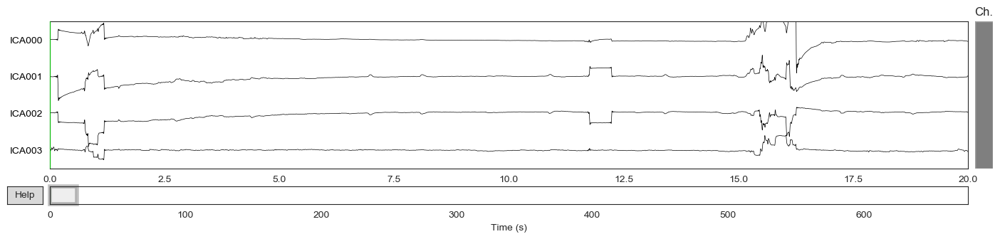

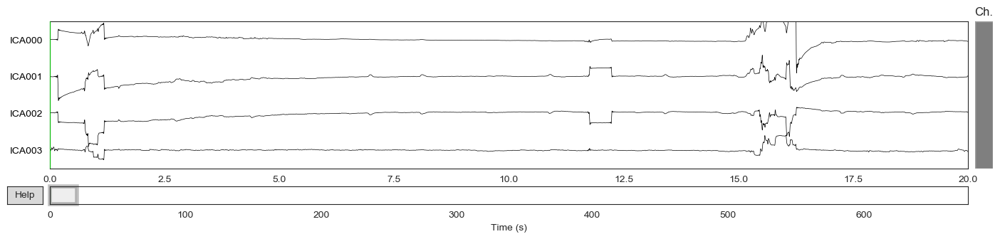

In [43]:
new_data.load_data()
ica.plot_sources(notch_data)

In [44]:
ica.exclude = [0]

In [45]:
reconst_raw = notch_data.copy()
ica.apply(reconst_raw)

Transforming to ICA space (4 components)
Zeroing out 1 ICA component


<RawArray | 4 x 135345 (676.7 s), ~4.1 MB, data loaded>

## Comparison

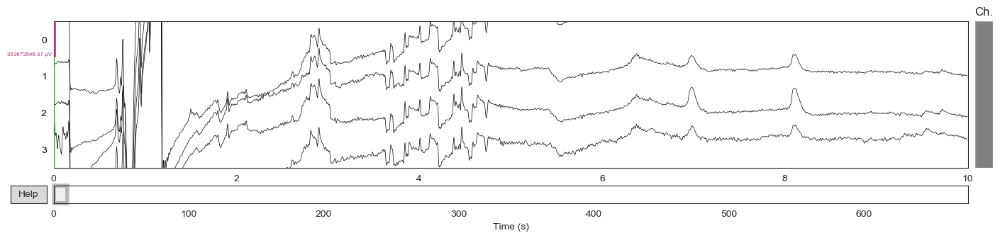

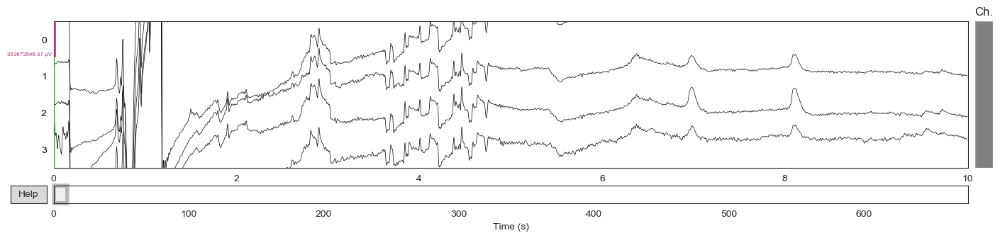

In [46]:
notch_data.plot(scalings='auto')

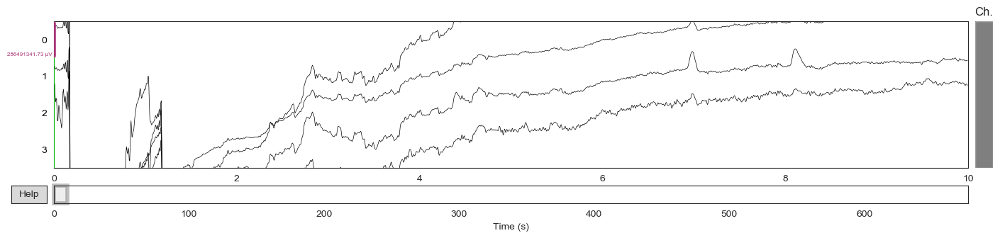

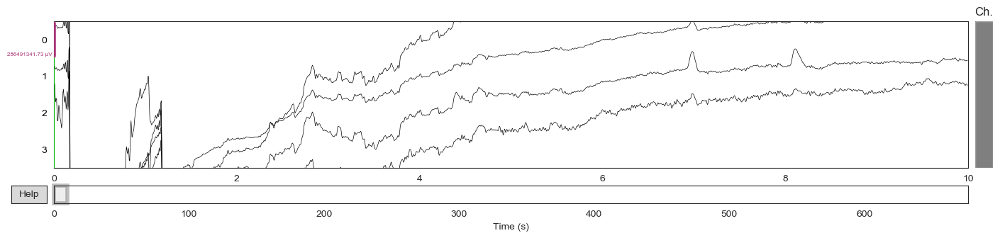

In [47]:
reconst_raw.plot(scalings='auto')

### PSD

Effective window size : 10.240 (s)


<ipython-input-48-a226f84db0de>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  notch_data.plot_psd()


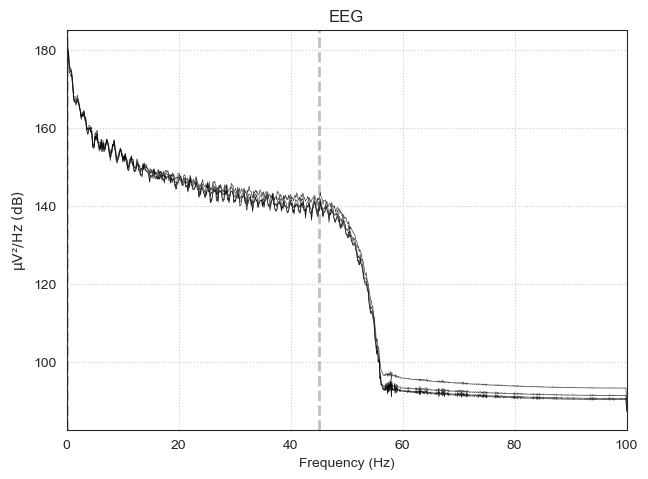

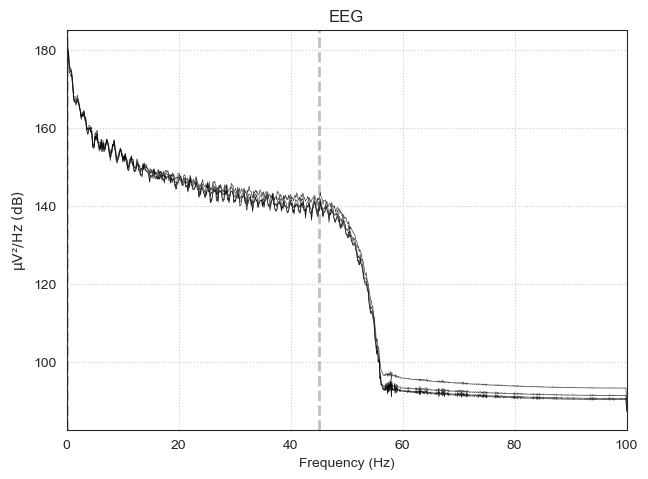

In [48]:
notch_data.plot_psd()

Effective window size : 10.240 (s)


<ipython-input-49-c59fb0b6a443>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  reconst_raw.plot_psd()


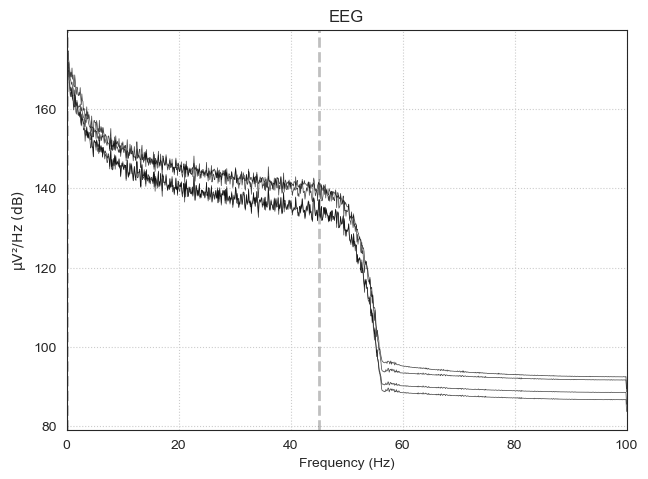

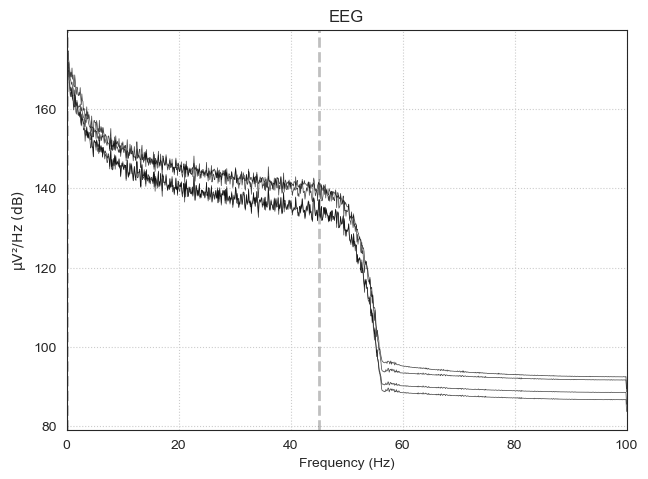

In [49]:
reconst_raw.plot_psd()